In [2]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
import os

from pathlib import Path
import json
from random import randint
from collections import Counter
from collections import defaultdict

from PIL import Image, ImageDraw
from IPython.display import display
from shapely import wkt
from shapely.geometry.multipolygon import MultiPolygon

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# figure size in inches 
rcParams['figure.figsize'] = 15, 15
plt.rcParams['legend.title_fontsize'] = 10

In [5]:
# Fetch all post disaster json files
labels_generator = Path('/content/drive/MyDrive/train/labels').rglob(pattern=f'*post_*.json')

In [6]:
# Group json files by disaster
def get_disaster_dict(labels_generator):    
    disaster_dict = defaultdict(list)
    for label in labels_generator:
        disaster_type = label.name.split('_')[0]
        disaster_dict[disaster_type].append(str(label))
    return disaster_dict

In [7]:
disaster_dict = get_disaster_dict(labels_generator)

In [8]:
# List of Disasters present in the dataset
disaster_dict.keys()

dict_keys(['socal-fire', 'santa-rosa-wildfire', 'mexico-earthquake', 'midwest-flooding', 'palu-tsunami', 'hurricane-matthew', 'hurricane-michael', 'hurricane-florence', 'hurricane-harvey', 'guatemala-volcano'])

In [9]:
disaster_dict.values()

dict_values([['/content/drive/MyDrive/train/labels/socal-fire_00000564_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000507_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000480_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000515_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000529_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000474_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000565_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000541_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000677_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000594_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000623_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00000652_post_disaster.json', '/content/drive/MyDrive/train/labels/socal-fire_00

In [10]:
# Select a particular disaster
disaster_labels = disaster_dict['hurricane-harvey']

In [11]:
def read_label(label_path):
    with open(label_path) as json_file:
        image_json = json.load(json_file)
        return image_json

In [12]:
# Color codes for polygons of different damage levels
# rgba
damage_dict = {
    "no-damage": (0, 255, 0, 50),  # green
    "minor-damage": (0, 0, 255, 50),  # blue
    "major-damage": (255, 69, 0, 50),  # brownish
    "destroyed": (255, 0, 0, 50),  # red
    "un-classified": (255, 255, 255, 50)
}

In [13]:
def get_damage_type(properties):
    if 'subtype' in properties:
        return properties['subtype']
    else:
        return 'no-damage'

In [14]:
# drawing polygons given coordinates in json
def annotate_img(draw, coords):
        wkt_polygons = []

        for coord in coords:
            damage = get_damage_type(coord['properties'])
            wkt_polygons.append((damage, coord['wkt']))

        polygons = []

        for damage, swkt in wkt_polygons:
            polygons.append((damage, wkt.loads(swkt)))

        for damage, polygon in polygons:
            x,y = polygon.exterior.coords.xy
            coords = list(zip(x,y))
            draw.polygon(coords, damage_dict[damage])

        del draw

In [15]:
def display_img(json_path, time='post', annotated=True):
    if time=='pre':
        json_path = json_path.replace('post', 'pre')
        
    img_path = json_path.replace('labels', 'images').replace('json','png')
        
    image_json = read_label(json_path)
    img_name = image_json['metadata']['img_name']
        
    print(img_name)
    
    img = Image.open(img_path)
    draw = ImageDraw.Draw(img, 'RGBA')
    
    if annotated:
        annotate_img(draw, image_json['features']['xy'])

    return img

In [16]:
def plot_image(label):

    # read images
    img_A = display_img(label, time='pre', annotated=False)
    img_B = display_img(label, time='post', annotated=False)
    img_C = display_img(label, time='pre', annotated=True)
    img_D = display_img(label, time='post', annotated=True)


    # display images
    fig, ax = plt.subplots(2,2)
    fig.set_size_inches(30, 30)
    TITLE_FONT_SIZE = 24
    ax[0][0].imshow(img_A);
    ax[0][0].set_title('Pre Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[0][1].imshow(img_B);
    ax[0][1].set_title('Post Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][0].imshow(img_C);
    ax[1][0].set_title('Pre Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][1].imshow(img_D);
    ax[1][1].set_title('Post Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    plt.savefig('split_image.png', dpi = 100)
    plt.show()

In [17]:
disaster_labels[0]

'/content/drive/MyDrive/train/labels/hurricane-harvey_00000006_post_disaster.json'

hurricane-harvey_00000006_post_disaster.png


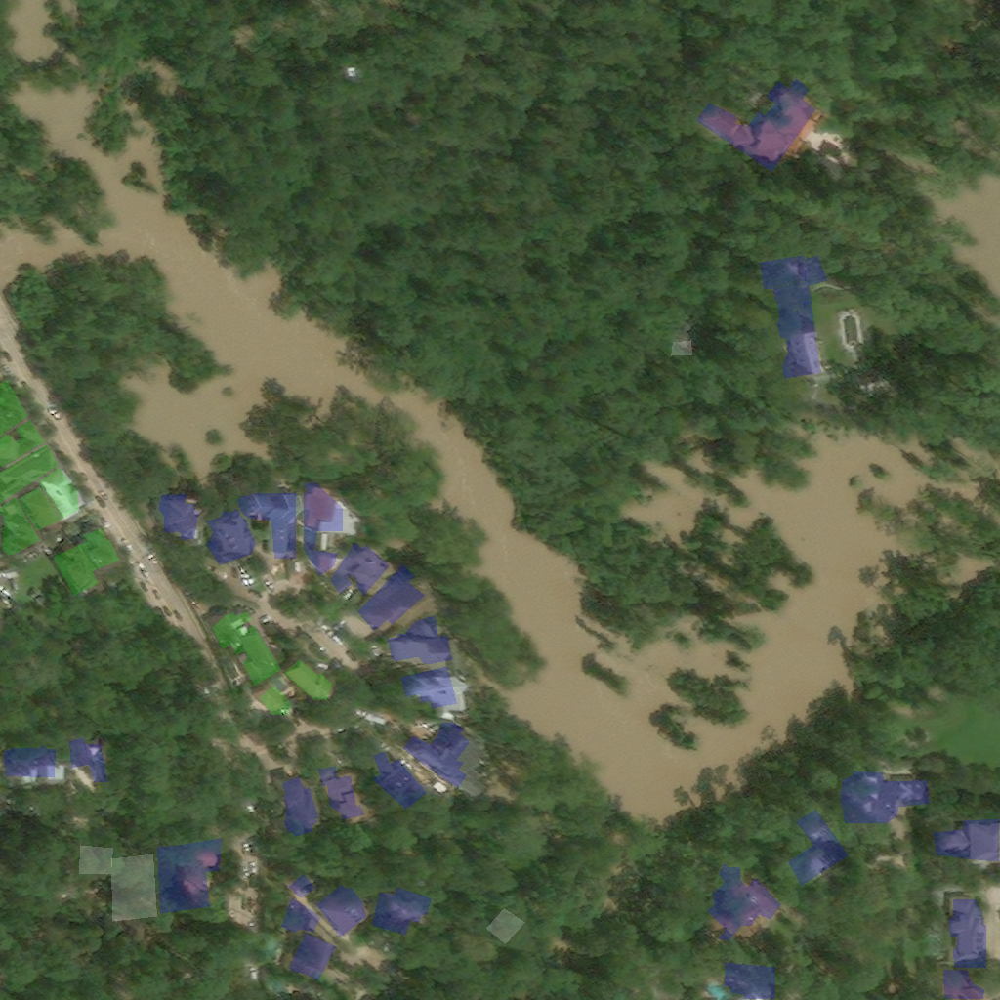

In [18]:
# Display a single image using label path. 
# `time` argument shows post or pre disaster images
# `annotated` argument labels images
display_img(disaster_labels[0], time='post', annotated=True)

In [19]:
# Get polygons center coords (lat, long)
def get_centroid(coords):
    polygons = [ wkt.loads(polygon['wkt']) for polygon in coords ]
    centroid =  MultiPolygon(polygons).centroid
    try:
        return {'centroid_x': centroid.x, 'centroid_y': centroid.y, 'latlong': centroid }
    except IndexError as e:
        return {'centroid_x': None, 'centroid_y': None, 'latlong': None }

In [20]:
def get_damage_dict(coords):
    damage_list = [ get_damage_type(coord['properties']) for coord in coords]
    return Counter(damage_list)

In [21]:
# Add centroid and damage dict to metadata
def metadata_with_damage(label_path):
    data = read_label(label_path)
    coords = data['features']['lng_lat']
    
    damage_dict = get_damage_dict(coords)
    centroid = get_centroid(coords)
    
    data['metadata'].update(centroid)
    data['metadata']['path'] = label_path
    data['metadata'].update(damage_dict)
    return data['metadata']
        
    

In [22]:
def generate_metadata_df(disaster_labels):
    metadata_list = [metadata_with_damage(label_path) for label_path in disaster_labels]
    df = pd.DataFrame(metadata_list)
    return df.fillna(df.mean())

In [23]:
# Sort df by destroyed count
df = generate_metadata_df(disaster_labels)
sorted_df = df.sort_values(by=['destroyed'], ascending=False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  after removing the cwd from sys.path.


In [40]:
sorted_df.head()

,sensor,provider_asset_type,gsd,capture_date,off_nadir_angle,pan_resolution,sun_azimuth,sun_elevation,target_azimuth,disaster,...,img_name,centroid_x,centroid_y,latlong,path,minor-damage,un-classified,no-damage,major-damage,destroyed
240,GEOEYE01,GEOEYE01,3.024613,2017-08-31T17:38:50.685Z,42.91436,0.753211,152.30608,66.44999,111.736275,hurricane-harvey,...,hurricane-harvey_00000406_post_disaster.png,-95.590122,29.763295,POINT (-95.59012226671405 29.76329476190368),/content/drive/MyDrive/train/labels/hurricane-...,20.804688,9.00000,73.696774,36.0,39.0
160,GEOEYE01,GEOEYE01,3.024613,2017-08-31T17:38:50.685Z,42.91436,0.753211,152.30608,66.44999,111.736275,hurricane-harvey,...,hurricane-harvey_00000289_post_disaster.png,-95.579422,29.457664,POINT (-95.57942231598841 29.457663505491055),/content/drive/MyDrive/train/labels/hurricane-...,1.000000,5.00000,73.696774,8.0,30.0
238,GEOEYE01,GEOEYE01,3.024613,2017-08-31T17:38:50.685Z,42.91436,0.753211,152.30608,66.44999,111.736275,hurricane-harvey,...,hurricane-harvey_00000493_post_disaster.png,-95.612709,29.820186,POINT (-95.61270879131871 29.820186318533764),/content/drive/MyDrive/train/labels/hurricane-...,20.804688,4.66129,73.696774,7.0,29.0
211,GEOEYE01,GEOEYE01,3.024613,2017-08-31T17:38:50.685Z,42.91436,0.753211,152.30608,66.44999,111.736275,hurricane-harvey,...,hurricane-harvey_00000391_post_disaster.png,-95.604155,29.763543,POINT (-95.60415490477253 29.763542985178102),/content/drive/MyDrive/train/labels/hurricane-...,26.000000,7.00000,73.696774,86.0,23.0
16,GEOEYE01,GEOEYE01,3.024613,2017-08-31T17:38:50.685Z,42.91436,0.753211,152.30608,66.44999,111.736275,hurricane-harvey,...,hurricane-harvey_00000099_post_disaster.png,-95.637662,29.839435,POINT (-95.63766214923558 29.839435150470447),/content/drive/MyDrive/train/labels/hurricane-...,20.804688,4.66129,73.696774,184.0,18.0


In [25]:
df_generator = sorted_df.iterrows()

In [26]:
# fetch first row 
index, row = next(df_generator)

In [27]:
# Shows damage polygon counts for image
row[['no-damage', 'minor-damage', 'major-damage', 'destroyed', 'un-classified']]

no-damage        73.696774
minor-damage     20.804688
major-damage          36.0
destroyed             39.0
un-classified          9.0
Name: 240, dtype: object

hurricane-harvey_00000406_pre_disaster.png


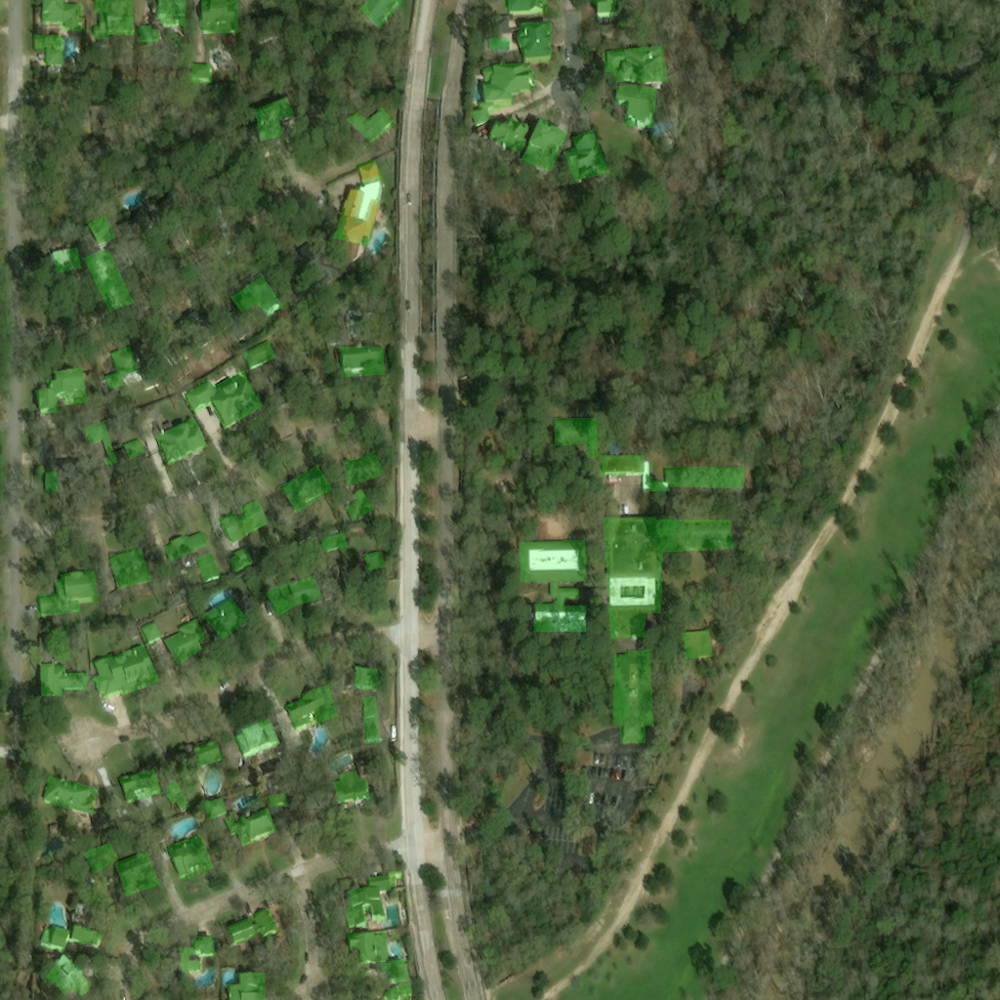

In [28]:
# shows pre disaster image
display_img(row.path, time='pre', annotated=True)

hurricane-harvey_00000406_post_disaster.png


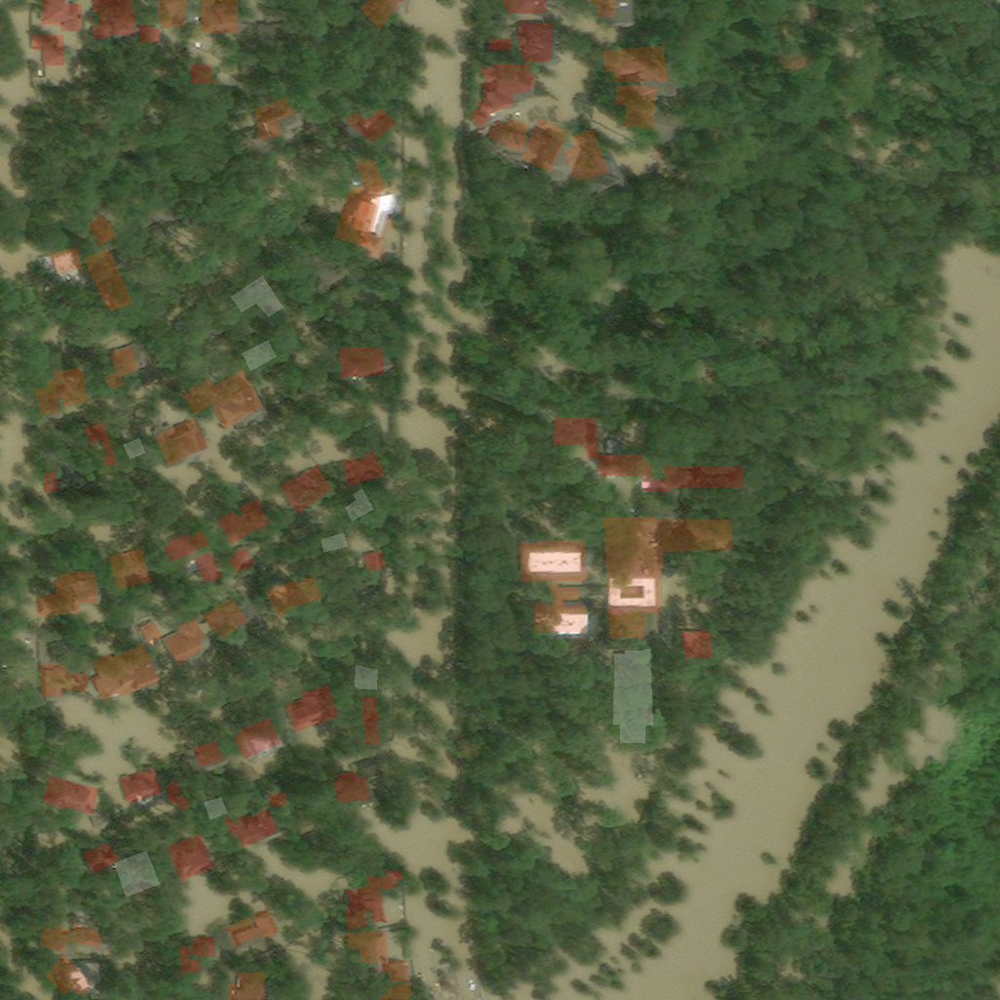

In [29]:
# shows post disaster image
display_img(row.path, time='post', annotated=True)

hurricane-harvey_00000406_pre_disaster.png
hurricane-harvey_00000406_post_disaster.png
hurricane-harvey_00000406_pre_disaster.png
hurricane-harvey_00000406_post_disaster.png


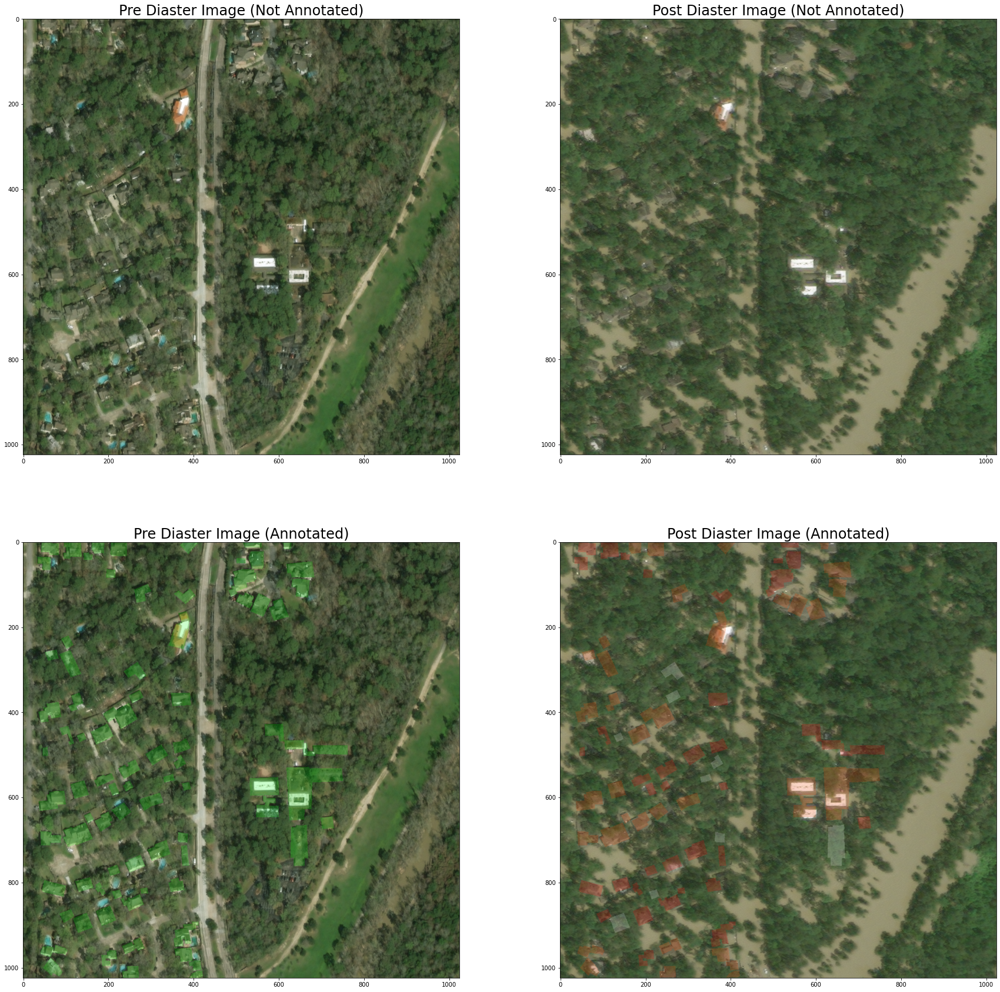

In [30]:
# plots pre and post disaster images with annotations
plot_image(row.path)

In [31]:
labels_generator = Path('/content/drive/MyDrive/train/labels').rglob(pattern=f'*.json')
full_df = generate_metadata_df(labels_generator)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  after removing the cwd from sys.path.


In [39]:
full_df.head()

,sensor,provider_asset_type,gsd,capture_date,off_nadir_angle,pan_resolution,sun_azimuth,sun_elevation,target_azimuth,disaster,...,img_name,centroid_x,centroid_y,latlong,path,no-damage,un-classified,destroyed,major-damage,minor-damage
0,WORLDVIEW02,WORLDVIEW02,2.570075,2018-11-14T18:42:58.000Z,32.674200,0.643838,163.31218,35.885086,334.12890,socal-fire,...,socal-fire_00000564_post_disaster.png,-86.096861,29.482030,None,/content/drive/MyDrive/train/labels/socal-fire...,69.774153,4.382138,14.745819,15.392391,17.561547
1,WORLDVIEW02,WORLDVIEW02,2.570075,2018-11-14T18:42:58.000Z,32.674200,0.643838,163.31218,35.885086,334.12890,socal-fire,...,socal-fire_00000507_post_disaster.png,-118.806852,34.141933,POINT (-118.80685173900639 34.14193315672738),/content/drive/MyDrive/train/labels/socal-fire...,50.000000,1.000000,14.745819,15.392391,17.561547
2,WORLDVIEW02,WORLDVIEW02,2.125994,2018-10-23T18:51:21.000Z,21.787466,0.530760,163.63159,42.702580,346.04532,socal-fire,...,socal-fire_00000552_pre_disaster.png,-118.920480,34.062515,POINT (-118.92048025234641 34.06251488918708),/content/drive/MyDrive/train/labels/socal-fire...,1.000000,4.382138,14.745819,15.392391,17.561547
3,WORLDVIEW02,WORLDVIEW02,1.989496,2018-10-23T18:51:02.000Z,15.396526,0.498313,163.75761,42.667400,333.27460,socal-fire,...,socal-fire_00000469_pre_disaster.png,-118.836117,34.025993,POINT (-118.836116560183 34.02599319730833),/content/drive/MyDrive/train/labels/socal-fire...,7.000000,4.382138,14.745819,15.392391,17.561547
4,WORLDVIEW02,WORLDVIEW02,1.989496,2018-10-23T18:51:02.000Z,15.396526,0.498313,163.75761,42.667400,333.27460,socal-fire,...,socal-fire_00000535_pre_disaster.png,-86.096861,29.482030,None,/content/drive/MyDrive/train/labels/socal-fire...,69.774153,4.382138,14.745819,15.392391,17.561547


In [38]:
full_df.columns

Index(['sensor', 'provider_asset_type', 'gsd', 'capture_date',
       'off_nadir_angle', 'pan_resolution', 'sun_azimuth', 'sun_elevation',
       'target_azimuth', 'disaster', 'disaster_type', 'catalog_id',
       'original_width', 'original_height', 'width', 'height', 'id',
       'img_name', 'centroid_x', 'centroid_y', 'latlong', 'path', 'no-damage',
       'un-classified', 'destroyed', 'major-damage', 'minor-damage'],
      dtype='object')

In [33]:
# plot bargraph based on an agg_func
def plot_bargraph(df, x, y, agg_func):
  new_df = df.groupby('disaster', as_index=False).agg(agg_func)

  for index, row in new_df.iterrows():
    plt.bar(row.disaster, row.gsd, label=row.disaster, align='center')
    
#   plt.legend(loc=1,prop={'size':18})

  plt.xticks(fontsize=12, rotation=45)
  fig = plt.gcf()
  fig.set_size_inches(15, 7)
  # plt.savefig(f'{agg_func}.png', dpi=100)
  plt.show()

**Mean GSD by grouped by Disaster**

The Ground Sampling Distance will help us get an idea on the spatial resolution of the images per disaster. This has help us normalize the images to a specific resolution during training.

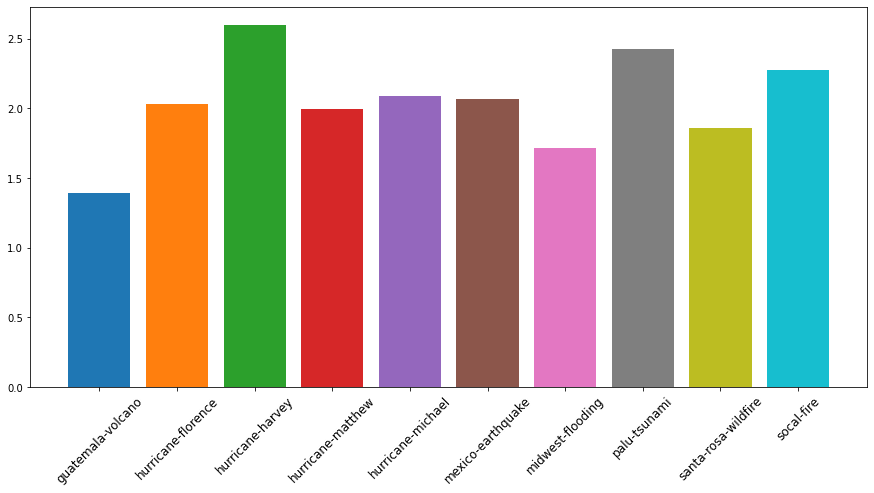

In [34]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='mean')

In [35]:
# Mean GSD for dataset
full_df['gsd'].mean()

2.1416393314744684

**Number of images per Disaster**

The number of datapoints per dataset will give us an idea on which disaster to focus on while training our model.

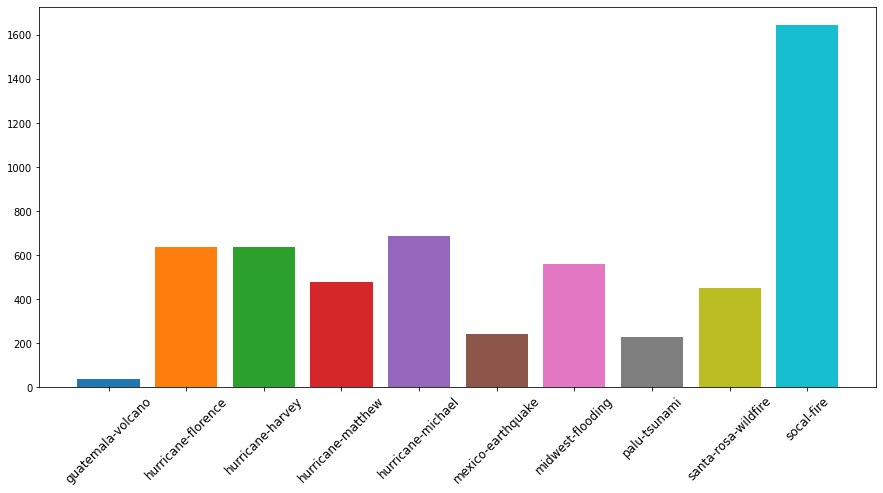

In [36]:
plot_bargraph(full_df, x='disaster', y='gsd', agg_func='count')